**LIBRARIES**

In [ ]:
# !apt install python3-rtree --quiet
# !pip install osmnx
!pip install pyproj osmnx geopandas
# !pip install geopandas
# !pip install matplotlib
!pip install torch

Defaulting to user installation because normal site-packages is not writeable


**IMPORTS**

In [1]:
## for data
import pandas as pd  #1.1.5
import numpy as np  #1.21.0

## for plotting
import matplotlib.pyplot as plt  #3.3.2
import seaborn as sns  #0.11.1
import folium  #0.14.0
from folium import plugins
import plotly.express as px  #5.1.0

# ## for simple routing
import osmnx as ox  #1.2.2
import networkx as nx  #3.0
from pyproj import Proj, transform

import geopandas as gpd
from shapely.geometry import Point, LineString, Polygon
import multiprocessing as mp
%matplotlib inline

import heapq
from math import radians, sin, cos, sqrt, atan2

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler



# ## for advanced routing
# from ortools.constraint_solver import pywrapcp  #9.6
# from ortools.constraint_solver import routing_enums_pb2

**GET GRAPH AND NODES BY PYPROJ, OSMNX**

**ENTER CITY CO-ORDINATES, START AND GOAL COORDINATES**

/home/swaksh/anaconda3/lib/python3.11/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/tmp/ipykernel_3626/3288100018.py:9: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  utm_x, utm_y = transform(wgs84, utm, longi, lati)


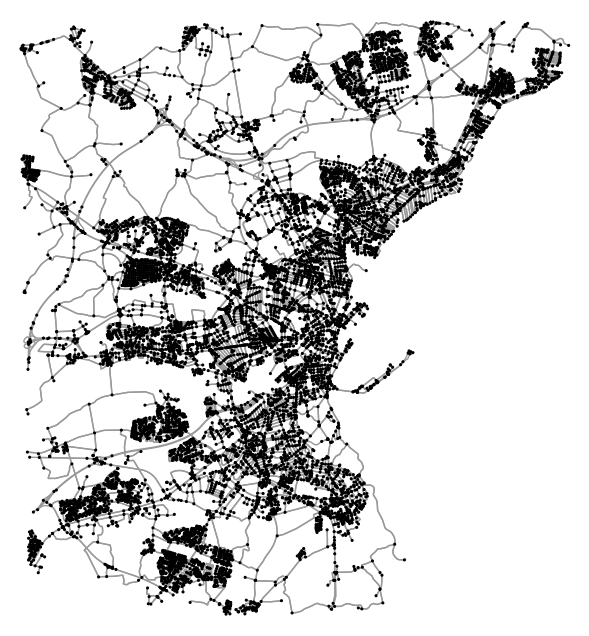

nodes: from 117306 --> to 503726692


In [2]:
#  Coordinates for Aarhus, Denmark
lati, longi = 56.1629, 10.2039

# Create a Proj object for the input WGS84 coordinates
wgs84 = Proj(init='epsg:4326')
utm = Proj(proj='utm', zone=32, ellps='WGS84')

# Transform the WGS84 coordinates to UTM
utm_x, utm_y = transform(wgs84, utm, longi, lati)

# Get the UTM zone from the transformed coordinates
utm_zone = int((utm_x + 180) / 6) + 1

# Print the UTM CRS code
utm_crs_code = f"epsg:326{utm_zone:02d}"

# Download street network data for Aarhus
G = ox.graph_from_point((lati, longi), dist=10000, simplify=True, network_type='drive')  #'drive', 'bike', 'walk'
G_proj = ox.project_graph(G, to_crs='epsg:32632')
G_proj = ox.add_edge_speeds(G_proj)
generic_weighted_projected_graph = ox.add_edge_travel_times(G_proj)

# Plot the graph
fig, ax = ox.plot_graph(G_proj, bgcolor="white", node_size=5, node_color="black", figsize=(16, 8))

start_lati, start_longi = 56.0886322,10.247566300000003
goal_latitude, goal_longitude = 56.23976358768423, 10.158806749994513

# Find nearest nodes to start and goal coordinates
start_node = ox.distance.nearest_nodes(G, start_longi, start_lati)
goal_node = ox.distance.nearest_nodes(G, goal_longitude, goal_latitude)
print("nodes: from", start_node, "--> to", goal_node)

In [4]:
print(G)

MultiDiGraph with 12596 nodes and 27503 edges


**MTL ALGORITHM For Traffic Prediction**

In [13]:
#  Assuming you have data for every hour, and each hour has its own set of features and labels
import pandas as pd
import numpy as np

df = pd.read_csv('TRAFFIC_DATA.csv')

# Split dataset into input features (X) and target variables (y)
X_traffic = np.array(df[['month','day','hour','minute','Edge']])
y_traffic = np.array(df[['avgSpeed', 'medianMeasuredTime','vehicleCount']])

X_traffic = X_traffic.astype(float)
print(X_traffic)
# Convert data to PyTorch tensors
X_traffic_tensor = torch.FloatTensor(X_traffic)
y_traffic_tensor = torch.FloatTensor(y_traffic)

dataset = TensorDataset(X_traffic_tensor, y_traffic_tensor)
batch_size = 256
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

num_traffic_features = 5
# Define Multi-Task Neural Network architecture
class Traffic_NN(nn.Module):
    def __init__(self):
        super(Traffic_NN, self).__init__()
        self.shared_layers = nn.Sequential(
            nn.Linear(num_traffic_features, 64),  # Adjust input size based on your traffic features
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU()
        )
        self.traffic_layers = nn.Sequential(
            nn.Linear(32, 16),
            nn.ReLU(),
            nn.Linear(16, 3)   # Output layer for traffic prediction
        )

    def forward(self, x_traffic):
        shared_out = self.shared_layers(x_traffic)
        traffic_out = self.traffic_layers(shared_out)
        return traffic_out

# Instantiate the model_traffic
model_traffic = Traffic_NN()

# Define loss function (you can choose different loss functions based on your problem)
criterion = nn.MSELoss()

# Define optimizer
optimizer = optim.Adam(model_traffic.parameters(), lr=0.001)

model_traffic_path = 'Traffic_Model.pt'

try:
    model_traffic.state_dict(torch.load(model_traffic_path))
    print("Our Pretrained model_traffic is loaded")
except FileNotFoundError:
    print("Train From Scratch")

    # Training loop
    epochs = 100
    for epoch in range(epochs):
        for batch in dataloader:
            x_traffic_batch, y_traffic_batch = batch

            # Forward pass
            traffic_pred = model_traffic(x_traffic_batch)

            # Compute losses
            loss_traffic = criterion(traffic_pred, y_traffic_batch)

            # Combine losses
            loss = loss_traffic

            # Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # Print progress
        print(f'Epoch [{epoch+1}/{epochs}], Total Loss: {loss.item()}')


[[  3.  13.  11.  30.   1.]
 [  3.  13.  11.  35.   1.]
 [  3.  13.  11.  40.   1.]
 ...
 [  3.   9.   5.  20. 449.]
 [  3.   9.   5.  25. 449.]
 [  3.   9.   5.  35. 449.]]
Epoch [1/100], Total Loss: 4877.44091796875
Epoch [2/100], Total Loss: 13692.408203125
Epoch [3/100], Total Loss: 22431.33203125
Epoch [4/100], Total Loss: 10926.4375
Epoch [5/100], Total Loss: 15844.3232421875
Epoch [6/100], Total Loss: 2177.07275390625
Epoch [7/100], Total Loss: 2425.273193359375
Epoch [8/100], Total Loss: 19422.798828125
Epoch [9/100], Total Loss: 36544.5859375
Epoch [10/100], Total Loss: 15465.787109375
Epoch [11/100], Total Loss: 5871.33740234375
Epoch [12/100], Total Loss: 12865.7646484375
Epoch [13/100], Total Loss: 2574.080810546875
Epoch [14/100], Total Loss: 3179.34375
Epoch [15/100], Total Loss: 7399.1064453125
Epoch [16/100], Total Loss: 2186.508544921875
Epoch [17/100], Total Loss: 10931.0712890625
Epoch [18/100], Total Loss: 16328.8720703125
Epoch [19/100], Total Loss: 15896.110351562

In [14]:
model_traffic_path = 'Traffic_Model.pt'
torch.save(model_traffic.state_dict(),model_traffic_path)

### Loading The Trained Model

In [3]:
num_traffic_features = 5
class Traffic_NN(nn.Module):
    def __init__(self):
        super(Traffic_NN, self).__init__()
        self.shared_layers = nn.Sequential(
            nn.Linear(num_traffic_features, 64),  # Adjust input size based on your traffic features
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU()
        )
        self.traffic_layers = nn.Sequential(
            nn.Linear(32, 16),
            nn.ReLU(),
            nn.Linear(16, 3)   # Output layer for traffic prediction
        )

    def forward(self, x_traffic):
        shared_out = self.shared_layers(x_traffic)
        traffic_out = self.traffic_layers(shared_out)
        return traffic_out

model_traffic = Traffic_NN()  # Instantiate your model class
model_traffic_path = 'Traffic_Model.pt'  # Path to your saved model file
model_traffic.load_state_dict(torch.load(model_traffic_path))  # Load model parameters


<All keys matched successfully>

**Test Data For The Testing Of MTLModel**

In [4]:

timestamp = "2019-03-14 1:30:00"
timestamp = pd.to_datetime(timestamp)
print(timestamp)
year = float(timestamp.year)
month = float(timestamp.month)
day = float(timestamp.day)
hour = float(timestamp.hour)
minute = float(timestamp.minute)
edge = 100

print(month)

2019-03-14 01:30:00
3.0


**PREDICT Traffic**

In [5]:
# Assuming you have new data for prediction, let's call it X_new_traffic and X_new_traffic
# Convert new data to PyTorch tensors
X_new_traffic = [['month',month],['day',day],['hour',hour],['minute',minute],['Edge',edge]]

X_new_traffic_values = [value for _, value in X_new_traffic]
X_new_traffic_tensor = torch.FloatTensor(X_new_traffic_values)

# Set model to evaluation mode
model_traffic.eval()

# Make predictions
with torch.no_grad():
    traffic_pred = model_traffic(X_new_traffic_tensor)

# Convert predictions to numpy arrays
traffic_pred = traffic_pred.numpy()

print(traffic_pred)


[36.410385 97.7134    2.202655]


**MTL Algorithm For Weather Prediction**

In [8]:
#  Assuming you have data for every hour, and each hour has its own set of features and labels
import pandas as pd
import numpy as np


df = pd.read_csv('WEATHER_DATA.csv')

# Split dataset into input features (X) and target variables (y)
X_weather = np.array(df[['month','day','hour','minute','Pressure','Temprature','Humidity','Visibility','WindDirection','WindSpeed']])
y_weather = np.array(df[['Agglomerative_Cluster_Labels']])

X_weather = X_weather.astype(float)
print(X_weather)
# Convert data to PyTorch tensors
X_weather_tensor = torch.FloatTensor(X_weather)
y_weather_tensor = torch.FloatTensor(y_weather)

# Create TensorDataset and DataLoader for efficient data loading
dataset = TensorDataset(X_weather_tensor, y_weather_tensor)
batch_size = 128
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

num_weather_features = 10
# Define Multi-Task Neural Network architecture
class Weather_NN(nn.Module):
    def __init__(self):
        super(Weather_NN, self).__init__()
        self.shared_layers = nn.Sequential(
            nn.Linear(num_weather_features, 64),  # Adjust input size based on your traffic features
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU()
        )
        self.weather_layers = nn.Sequential(
            nn.Linear(32, 16),
            nn.ReLU(),
            nn.Linear(16, 1)   # Output layer for traffic prediction
        )

    def forward(self, x_weather):
        shared_out = self.shared_layers(x_weather)
        weather_out = self.weather_layers(shared_out)
        return weather_out

# Instantiate the model
model_weather = Weather_NN()

# Define loss function (you can choose different loss functions based on your problem)
criterion = nn.MSELoss()

# Define optimizer
optimizer = optim.Adam(model_weather.parameters(), lr=0.001)

# Training loop with validation
epochs = 500
for epoch in range(epochs):
    for batch in dataloader:
        x_weather_batch, y_weather_batch = batch

        # Forward pass
        weather_pred = model_weather(x_weather_batch)

        # Compute losses
        loss_weather = criterion(weather_pred, y_weather_batch)

        # Combine losses
        loss = loss_weather

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Print progress
    print(f'Epoch [{epoch+1}/{epochs}], Total Loss: {loss.item()}')


[[  3.   13.    0.  ...  29.  160.   18.5]
 [  3.   13.    0.  ...  10.  160.   20.4]
 [  3.   13.    0.  ...  10.  160.   22.2]
 ...
 [  3.    8.   23.  ...  14.  300.   13. ]
 [  3.    8.   23.  ...  10.  300.   11.1]
 [  3.    8.   23.  ...  10.  290.    7.4]]
Epoch [1/500], Total Loss: 0.8343018889427185
Epoch [2/500], Total Loss: 0.9001362919807434
Epoch [3/500], Total Loss: 0.4408166706562042
Epoch [4/500], Total Loss: 0.5126366019248962
Epoch [5/500], Total Loss: 0.7381218075752258
Epoch [6/500], Total Loss: 0.7411630749702454
Epoch [7/500], Total Loss: 0.7365437150001526
Epoch [8/500], Total Loss: 0.5922802090644836
Epoch [9/500], Total Loss: 13.406522750854492
Epoch [10/500], Total Loss: 0.8770054578781128
Epoch [11/500], Total Loss: 0.5792176723480225
Epoch [12/500], Total Loss: 1.784441590309143
Epoch [13/500], Total Loss: 0.5794512033462524
Epoch [14/500], Total Loss: 0.5694684982299805
Epoch [15/500], Total Loss: 1.6877425909042358
Epoch [16/500], Total Loss: 0.49240249395

In [9]:
# Save the trained model
torch.save(model_weather.state_dict(), 'weather_model.pt')

In [6]:
num_weather_features = 10
# Define Multi-Task Neural Network architecture
class Weather_NN(nn.Module):
    def __init__(self):
        super(Weather_NN, self).__init__()
        self.shared_layers = nn.Sequential(
            nn.Linear(num_weather_features, 64),  # Adjust input size based on your traffic features
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU()
        )
        self.weather_layers = nn.Sequential(
            nn.Linear(32, 16),
            nn.ReLU(),
            nn.Linear(16, 1)   # Output layer for traffic prediction
        )

    def forward(self, x_weather):  # add here x_traffic
        shared_out = self.shared_layers(x_weather)
        weather_out = self.weather_layers(shared_out)
        return weather_out # add here traffic_out

model_weather = Weather_NN()  # Instantiate your model class
model_weather_path = 'weather_model.pt'  # Path to your saved model file
model_weather.load_state_dict(torch.load(model_weather_path))  # Load model parameters

<All keys matched successfully>

**Testing Weather MTLAlgorithm On The Weather Data at The Time Instant** 

In [7]:

timestamp = "2014-02-13T03:20:00"
timestamp = pd.to_datetime(timestamp)
print(timestamp)
year = float(timestamp.year)
month = float(timestamp.month)
day = float(timestamp.day)
hour = float(timestamp.hour)
minute = float(timestamp.minute)
# X_mean_avgSpeed = 81   2014-02-13T02:20:00,992,3.0,87,10.0,160,18.5,0
# X_mean_medianMeasuredTime = 55
# edge = 25
pressure = 1000
temp = 7.0
hum = 78
vis = 18
wind_dir = 170
wind_s = 16.4

print(month)

2014-02-13 03:20:00
2.0


**Prediction Of Weather Here Pred_Value Close To 0-Good , 1-Moderate , 2-Bad**

In [8]:
# Assuming you have new data for prediction, let's call it X_new_weather and X_new_weather
# Convert new data to PyTorch tensors
X_new_weather = [['month',month],['day',day],['hour',hour],['minute',minute],['Pressure',pressure],['Temprature',temp],['Humidity',hum],['Visibility',vis],['WindDirection',wind_dir],['WindSpeed',wind_s]]
X_new_weather_values = [value for _, value in X_new_weather]
X_new_weather_tensor = torch.FloatTensor(X_new_weather_values)

# Set model to evaluation mode
model_weather.eval()

# Make predictions
with torch.no_grad():
    weather_pred = model_weather(X_new_weather_tensor)

# Convert predictions to numpy arrays
weather_pred = weather_pred.numpy()

print(weather_pred)
# Now traffic_pred and traffic_pred contain the predicted traffic and traffic values respectively for the new data


[0.20558965]


**Taking Random Values For The Road Quality 2- Lane Road, 4- Lane Road , 6 - Lane Road**

In [9]:
road_types = []
for edge_tuple in G.edges:
    length = G.edges[edge_tuple]['length']
    road_type = G.edges[edge_tuple].get('highway', 'Unknown')
    speed_limit = G.edges[edge_tuple].get('maxspeed', 'Unknown')
    osm_id = G.edges[edge_tuple]['osmid']
    road_types.append(road_type)


road_types = pd.Series(road_types)
road_types.value_counts()

residential                       18939
tertiary                           4621
unclassified                       1752
secondary                           805
living_street                       520
secondary_link                      295
tertiary_link                       210
motorway_link                       109
primary                              47
motorway                             44
[unclassified, residential]          36
primary_link                         33
trunk                                32
[living_street, residential]         18
trunk_link                           10
disused                               7
[residential, tertiary]               6
[unclassified, tertiary]              6
[trunk, primary]                      4
[motorway, secondary]                 2
[motorway_link, trunk]                1
[motorway_link, tertiary_link]        1
[tertiary_link, tertiary]             1
[secondary, tertiary]                 1
[unclassified, secondary_link]        1


### Start And End Node Selection 

In [10]:
import warnings

# Ignore warnings
warnings.filterwarnings("ignore")
# Find nearest nodes to start and goal coordinates
# start_lati, start_longi = 56.10908789999999, 10.0824518
# goal_latitude, goal_longitude = 56.1924842, 10.1877023

start_longi,start_lati = 10.1177416 , 56.08045679999999
# goal_longi, goal_lati = 10.1934221 , 56.117051499999995
# person1_longi, person1_lati = 10.16534 , 56.1251012 
# person2_longi, person2_lati = 10.1814745 , 56.14053280000001
# person3_longi,person3_lati = 10.048428 , 56.2127462
goal_longi,goal_lati = 10.1638976 , 56.218999000000004

start_node = ox.distance.nearest_nodes(G, start_longi, start_lati)
goal_node = ox.distance.nearest_nodes(G, goal_longitude, goal_latitude)
print("nodes: from", start_node, "--> to", goal_node)

nodes: from 11355535598 --> to 503726692


## Astar

In [11]:

def haversine_distance(node1, node2):
    # Calculate haversine distance between two nodes
    R = 6371  # Earth radius in kilometers

    lat1, lon1 = radians(node1['y']), radians(node1['x'])
    lat2, lon2 = radians(node2['y']), radians(node2['x'])

    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = sin(dlat / 2) ** 2 + cos(lat1) * cos(lat2) * sin(dlon / 2) ** 2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    return R * c

import heapq

def astar_with_edge_info(graph, start, goal):
    open_queue = [(0, start)]
    visited = set()
    cost_so_far = {start: 0}
    came_from = {}
    edge_info = {}  # To store edge information

    while open_queue:
        _, current = heapq.heappop(open_queue)

        if current == goal:
            path = []
            edges_id = []
            edge_weights = []
            roads_quality = []

            while current in came_from:
                previous = came_from[current]
                edge = graph.edges[previous, current, 0]  # Assuming single edge between nodes
                path.append(current)
                edges_id.append(edge['osmid'])
                edge_weights.append(edge['length'])
                roads_quality.append(edge.get('highway', 'Unknown'))
                current = previous

            path.append(start)
            path.reverse()
            edges_id.reverse()
            edge_weights.reverse()
            roads_quality.reverse()

            return path, edges_id, edge_weights, roads_quality

        visited.add(current)

        for neighbor in graph.neighbors(current):
            new_cost = cost_so_far[current] + graph[current][neighbor][0].get('length', 1)  # Assuming single edge between nodes
            if neighbor not in visited or new_cost < cost_so_far.get(neighbor, float('inf')):
                cost_so_far[neighbor] = new_cost
                priority = new_cost + haversine_distance(graph.nodes[neighbor], graph.nodes[goal])
                heapq.heappush(open_queue, (priority, neighbor))
                came_from[neighbor] = current
                edge_info[neighbor] = graph[current][neighbor][0]['osmid']  # Assuming single edge between nodes

    return None, None, None  # No path found


# Run A* algorithm with edge information
path_astar, edges_id_astar, edge_weights_astar,roads_quality_astar = astar_with_edge_info(G, start_node, goal_node)

edges_id_astar = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_astar]
# edges_id_t_p1 = [osm_id[0] if isinstance(osm_id, list) and len(osm_id) > 1 else osm_id for osm_id in edges_id_astar]
if path_astar is not None:
    print("Path:", path_astar)
    print("Edge ID(OSMID)", edges_id_astar)
    print("Edge Weights:", edge_weights_astar)
    print("Roads Types ", roads_quality_astar)
else:
    print("No path found.")



Path: [11355535598, 10065121764, 254016131, 4927543282, 4927543277, 13706159, 13706174, 260450397, 1609866347, 118421063, 1582402502, 1582923323, 5471332821, 1582923334, 446288112, 446288107, 446288108, 446288109, 672040152, 334367987, 1572484945, 1573888340, 518024676, 518024191, 251550328, 1565210058, 1565210093, 1565210143, 251549957, 1565163425, 368363225, 1565163498, 1565163508, 5794487186, 5794487179, 251704864, 1782300032, 5794487197, 5794487228, 5794486863, 5794486866, 5794487151, 5794486801, 1510047203, 5794486810, 1510047208, 5794486444, 2028554375, 2028554389, 2028554427, 1501836691, 1501836715, 75496217, 5819451137, 252327811, 5819451079, 258332258, 4902206038, 253274710, 253274679, 253274666, 4902206064, 4929086371, 247454609, 256346051, 4900504856, 876198131, 293401364, 5821793431, 75502407, 258228294, 4900367310, 339039501, 5821793178, 262336460, 5821793173, 429298491, 262336463, 5840808165, 267040735, 267040881, 206373845, 5840808068, 206373848, 367042044, 429292407, 36

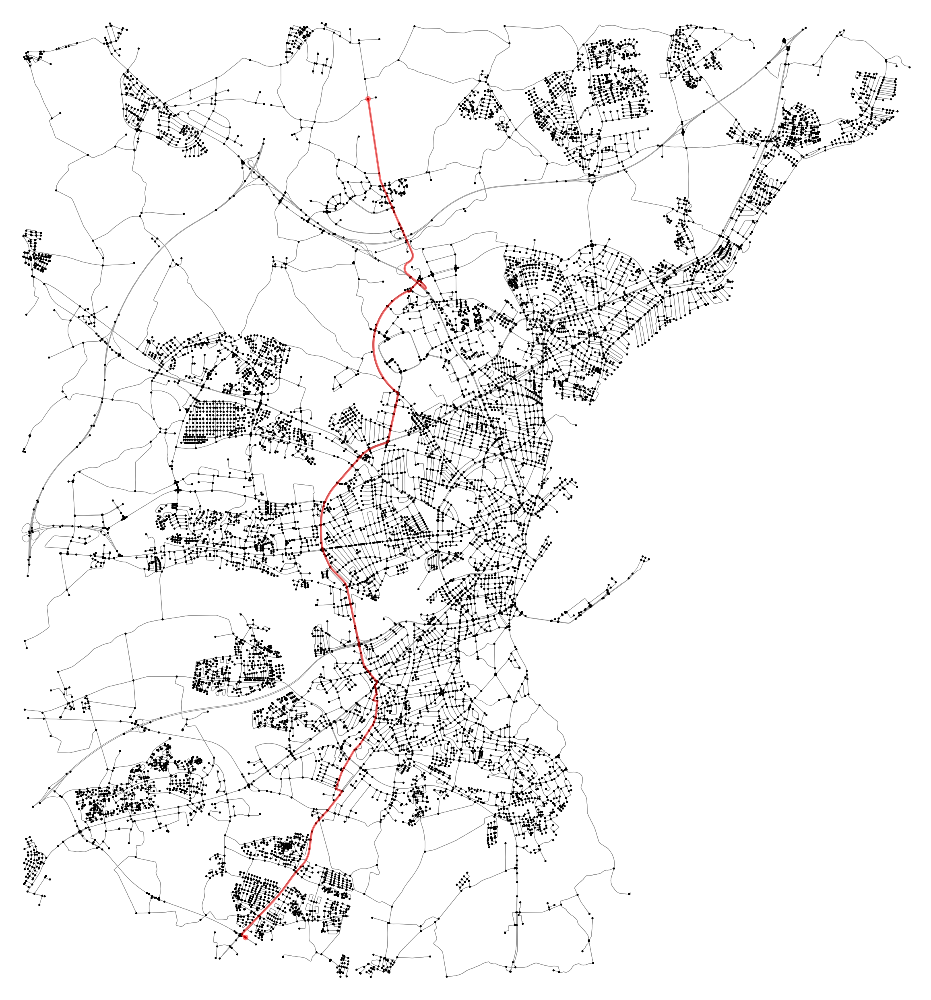

In [12]:
ig, ax = ox.plot_graph_route(G, route=path_astar,
                               route_color="red",
                                route_linewidth=4, node_size=15,
                                bgcolor='white', node_color="black",
                                figsize=(64, 32))

In [15]:
print(G.edges)

[(117270, 1574482839, 0), (117270, 3508051847, 0), (117275, 3142629619, 0), (117275, 1579843923, 0), (117275, 3508052812, 0), (117283, 251616039, 0), (117283, 476779511, 0), (117283, 1265965734, 0), (117306, 117306, 0), (117306, 117306, 1), (117306, 251616039, 0), (117366, 106224348, 0), (117366, 162471912, 0), (117366, 2612749479, 0), (117392, 11209254572, 0), (117405, 4900626886, 0), (117405, 1583987300, 0), (117406, 251844574, 0), (117406, 4291052783, 0), (117442, 32996799, 0), (723177, 293433010, 0), (723177, 578255940, 0), (723177, 578007008, 0), (723178, 420281130, 0), (723178, 256338129, 0), (723178, 256339409, 0), (723194, 256338431, 0), (723194, 886357836, 0), (723194, 1583995816, 0), (723195, 1583995825, 0), (723195, 886357836, 0), (723195, 1583995814, 0), (723203, 1024831052, 0), (723203, 1568949452, 0), (723203, 1583995825, 0), (723204, 1024831052, 0), (723204, 723207, 0), (723204, 941546583, 0), (723207, 723204, 0), (723214, 3837265467, 0), (723214, 254757361, 0), (723214,

**FINDING Out Of THREE BEST ROUTE DIJKSTRA, ASTAR, BellmanFord**

In [13]:

path_dijkstra = nx.shortest_path(G, source=start_node, target=goal_node, weight='length')
edge_weights_dijkstra = [G[path_dijkstra[i]][path_dijkstra[i+1]][0].get('length', 1) for i in range(len(path_dijkstra)-1)]
edges_id_dijkstra = [G[path_dijkstra[i]][path_dijkstra[i+1]][0]['osmid'] for i in range(len(path_dijkstra)-1)]
roads_quality_dijkstra = [G[path_dijkstra[i]][path_dijkstra[i+1]][0].get('highway', 'Unknown') for i in range(len(path_dijkstra)-1)]

path_bellman_ford = nx.bellman_ford_path(G, source=start_node, target=goal_node, weight='length')
edge_weights_bellman_ford = [G[path_bellman_ford[i]][path_bellman_ford[i+1]][0].get('length', 1) for i in range(len(path_bellman_ford)-1)]
edges_id_bellman_ford = [G[path_bellman_ford[i]][path_bellman_ford[i+1]][0]['osmid'] for i in range(len(path_bellman_ford)-1)]
roads_quality_bellman_ford = [G[path_bellman_ford[i]][path_bellman_ford[i+1]][0].get('highway', 'Unknown') for i in range(len(path_bellman_ford)-1)]


edges_id_dijkstra = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_dijkstra]
edges_id_bellman_ford = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_bellman_ford]

# Print results
print("Dijkstra's Algorithm:")
print("Path:", path_dijkstra)
print("Edge ID(OSMID):", edges_id_dijkstra)
print("Edge Weights:", edge_weights_dijkstra)
print("Roads Quality:", roads_quality_dijkstra)
print("Sum:", np.sum(edge_weights_dijkstra))

print("\nBellman-Ford Algorithm:")
print("Path:", path_bellman_ford)
print("Edge ID(OSMID):", edges_id_bellman_ford)
print("Edge Weights:", edge_weights_bellman_ford)
print("Roads Quality:", roads_quality_bellman_ford)
print("Sum:", np.sum(edge_weights_bellman_ford))

Dijkstra's Algorithm:
Path: [11355535598, 10065121764, 254016131, 4927543282, 4927543277, 13706159, 13706174, 260450397, 1609866347, 118421063, 1582402502, 1582923323, 5471332821, 1609866405, 1582923358, 1582923367, 1565944224, 4910984014, 1567677595, 253142717, 256817220, 256817221, 1565210094, 4927454423, 1565944509, 1565944537, 1565944540, 175678048, 1557434911, 1557435040, 1557435124, 1557435133, 1557435167, 1557521885, 4835399543, 1556123871, 1556124022, 1556124071, 1556124115, 1556124156, 1561585932, 1561586031, 1556124600, 1555894409, 63564758, 1555894473, 721563178, 1559349835, 256349062, 6499169134, 1597982713, 5236389741, 1573825079, 1597982789, 1597982810, 3075295164, 1597982821, 4927465032, 4378531966, 4378531971, 4378531977, 71138683, 1602608962, 255234439, 71488712, 60268747, 60268751, 106034511, 8942707260, 8942707256, 106351706, 60268764, 106351710, 106224022, 515113728, 60265067, 60265073, 344498934, 60265103, 1573163108, 60265096, 1227838714, 392744922, 106078618, 432

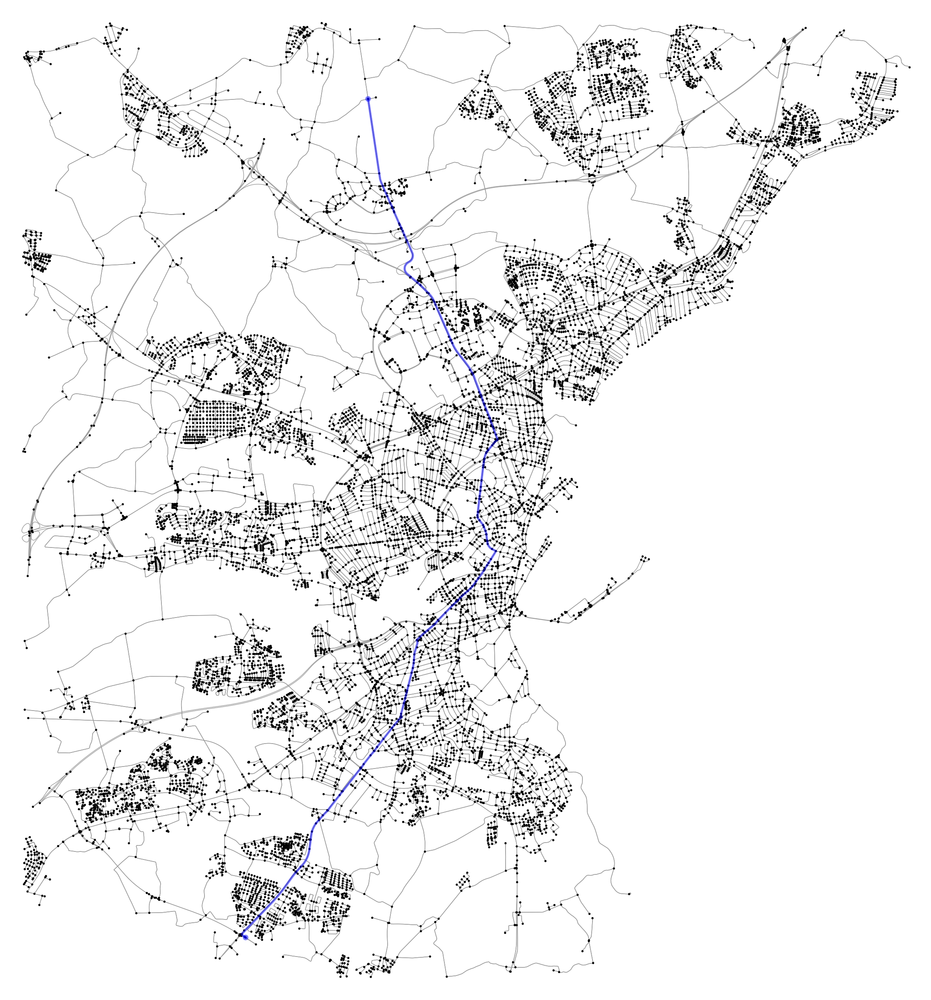

In [14]:
fig, ax = ox.plot_graph_route(G, route=path_dijkstra,
                               route_color="blue",
                                route_linewidth=4, node_size=15,
                                bgcolor='white', node_color="black",
                                figsize=(64, 32))

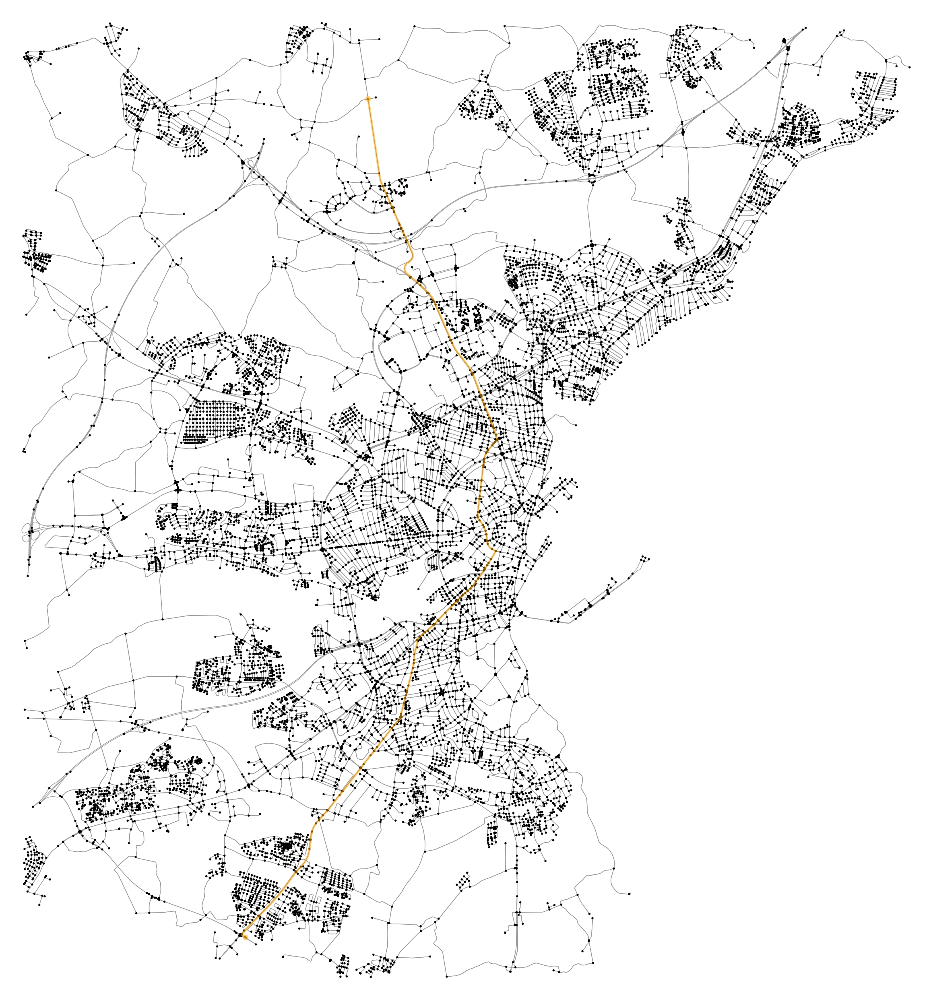

In [16]:
fig, ax = ox.plot_graph_route(G, route=path_bellman_ford,
                               route_color="orange",
                                route_linewidth=4, node_size=15,
                                bgcolor='white', node_color="black",
                                figsize=(64, 32))

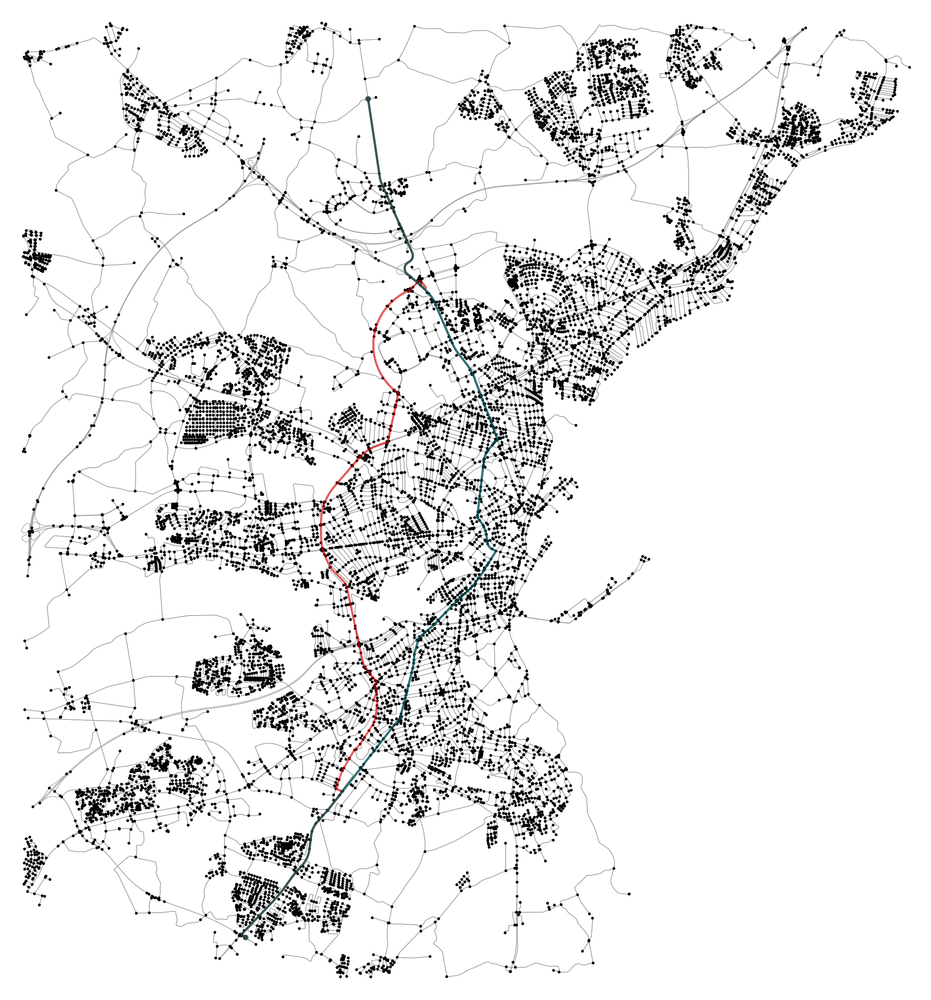

In [17]:
import osmnx as ox

# Plot on the graph
fig, ax = ox.plot_graph_routes(G, routes=[path_astar, path_dijkstra,path_bellman_ford],
                               route_colors=["red","blue","green"],
                                route_linewidth=5, node_size=25,
                                bgcolor='white', node_color="black",
                                figsize=(64, 32))

plt.show()


**HOW TO COMPARE THESE ROUTES AND GET BEST BY traffic, POI, traffic, ROAD QUALITY**

In [ ]:
# 3 things to do
# 1. Weights reduce how according to various factors and by what amount
# 2. Selections of different routes through different algorithms
# 3. Handling of the edges

# From the osmnx library default length is in metres(m).


**All Three Parameters To Be Converted To High Low and Moderate Values** 

In [18]:
good_road_qualities = ['motorway', 'primary', 'trunk', 'motorway_link', 'primary_link', 'trunk_link']
moderate_road_qualities = ['secondary', 'tertiary', 'secondary_link', 'tertiary_link']
lower_road_qualities = ['residential', 'unclassified', 'living_street', 'disused']

def traffic_to_hml_values(predicted_traffic):
    if predicted_traffic <= 6:
        return "BAD"        # for the low traffic 
    elif predicted_traffic > 15:
        return "GOOD"       # for the high traffic
    else:
        return "MODERATE"
    
def weather_to_hml_values(predicted_weather):
    if predicted_weather > 1.5 or weather_pred <=0:
        return "BAD"
    elif predicted_weather <0.5 and weather_pred >0:
        return "GOOD"
    else:
        return "MODERATE"
    
def roads_condition_to_hml_values(predicted_road_type):
    if predicted_road_type in good_road_qualities:
        return "GOOD"
    elif predicted_road_type in moderate_road_qualities:
        return "MODERATE"
    else:
        return "BAD"

#### Time Update

In [19]:
def time_update(dt,hr,min,val):
    min = min + val
    if min >=60:
        min = min - 60
        hr = hr +1
    if hr >= 24:
        hr = 0
        dt = dt+1
    new_time = np.array([dt,hr,min])

    return new_time 

### Based On These 3 Parameters Reduction Of The Weights

**Traffic Considering**:
* v + 20 → L
* v → M
* v - 20 → H

**Weather Considering**:
* v - 10 → L
* v → M
* v → G

**Road Conditions Considering**:
* v - 20 → L
* v + 10 → M
* v + 40 → H            

**H means Good and L means Bad**

In [20]:
def update_that_edge_weight(distance,speed,road,weather,traffic):
    # Case -1 High traffic then --> neglect road condition and consider --> weather only
    if traffic == "GOOD":
        speed = speed - (20 * (50/3))
        if weather == "BAD":
            speed = speed - (10 * (50/3))

    # Case -2  Traffic --> Moderate --> Both To Consider Roasd Conditions and Weather
    elif traffic == "MODERATE":
        speed = speed
        if weather == "BAD":
            speed = speed - (10  * (50/3))# elif weather == "GOOD" or weather == "MODERATE" speed = speed --> 3 cases of weather
        if road == "GOOD":
            speed = speed + (40 * (50/3))
        elif road == "MODERATE":
            speed = speed + (10 * (50/3))
        elif road == "BAD":
            speed = speed - (20 * (50/3))

    # Case -3  Traffic --> Low --> Both To Consider Road Conditions and Weather
    elif traffic == "BAD":  # bad means low traffic
        speed = speed + (20 * (50/3))
        # print("Here")
        if weather == "BAD":
            speed = speed - (30 * (50/3)) # elif weather == "GOOD" or weather == "MODERATE" speed = speed --> 3 cases of weather
        if road == "GOOD":
            speed = speed + (40 * (50/3))
        elif road == "MODERATE":
            # print("here")
            speed = speed + (10 * (50/3))
        elif road == "BAD":
            speed = speed - (20 * (50/3))
    # print(speed)
    new_time = distance / speed
    return new_time

In [21]:
def calculate_updated_weights(weights_list,rd_qualities,edges_osmid,year,m,dy,hr,min,pr,t,h,v,win_dir,win_s):
    new_weights = []
    count = 0
    new_time_all = []
    # print("Length  is this: ",len(weights_list))
    for i in range(len(weights_list)):
        count +=1 
        # print(count)    
        distance = weights_list[i]
        # Road conditions
        road_cond = roads_condition_to_hml_values(rd_qualities[i])
        
        # Weather conditions
        X_new_weather = [['month',m],['day',dy],['hour',hr],['minute',min],['Pressure',pr],['Temprature',t],['Humidity',h],['Visibility',v],['WindDirection',win_dir],['WindSpeed',win_s]]
        X_new_weather_values = [value for _, value in X_new_weather]
        X_new_weather_tensor = torch.FloatTensor(X_new_weather_values)
        model_weather.eval()
        with torch.no_grad():
            weather_pred = model_weather(X_new_weather_tensor)
        weather_cond = weather_to_hml_values(weather_pred)
        # print(weather_cond)
        
        # traffic conditions
        edge_id = edges_osmid[i]
        eg = np.mod(edge_id,450)
        X_new_traffic = [['month',m],['day',dy],['hour',hr],['minute',min],['Edge',eg]]
        X_new_traffic_values = [value for _, value in X_new_traffic]
        # print(eg)
        X_new_traffic_tensor = torch.FloatTensor(X_new_traffic_values)
        model_traffic.eval()
        with torch.no_grad():
            traffic_pred = model_traffic(X_new_traffic_tensor)
        traffic_pred = np.array(traffic_pred)
        avgSpeed_pred = traffic_pred[0]
        traffic_cond = traffic_to_hml_values(traffic_pred[2]) # vehicle count according we will tell
        avgSpeed_pred = (avgSpeed_pred * 50)/3 # speed in m/(min)
        # print("Traffic Cond: ",traffic_cond)
        
        updated_weight = update_that_edge_weight(distance,avgSpeed_pred,road_cond,weather_cond,traffic_cond)
        # print(updated_weight)
        new_weights.append(updated_weight)
        
        new_time = time_update(dt=dy,hr=hr,min=min,val=updated_weight)
        # print("yoo",new_time)
        dy = new_time[0]
        hr = new_time[1]
        min = new_time[2]
        new_time_all = new_time

    new_weights = np.array(new_weights)
    new_time_all = np.array(new_time_all)
    # print(new_time_all)
    
    return new_weights , new_time_all


## Astar Updated Weights

In [24]:
timestamp = "2014-03-13T15:30:00"
timestamp = pd.to_datetime(timestamp)
print(timestamp)
year = float(timestamp.year)
month = float(timestamp.month)
day = float(timestamp.day)
hour = float(timestamp.hour)
minute = float(timestamp.minute)
pressure = 1000
temp = 7.0
hum = 78
vis = 18
wind_dir = 170
wind_s = 16.4
print(np.sum(edge_weights_astar))

new_weights_astar, new_time_astar = calculate_updated_weights(edge_weights_astar,roads_quality_astar,edges_id_astar,year,month,day,hour,minute,pressure,temp,hum,vis,wind_dir,wind_s)

print("New Weights is: ",new_weights_astar)
print("Time required them to reach destination is: ",np.sum(new_weights_astar))


2014-03-13 15:30:00
21185.156000000003
New Weights is:  [0.11526675 0.5453832  0.94054707 0.00837408 0.13026548 0.34003736
 0.15803348 0.13838247 0.14986775 0.09415519 0.21426272 0.36640771
 0.08756766 0.13244845 0.11595253 0.22946153 0.43804633 0.13923375
 0.48119513 0.01240287 0.15932574 0.13225096 0.0862722  0.04185032
 0.13366282 0.11157553 0.05401131 0.08406535 0.23114396 0.08470768
 0.1179914  0.24123014 0.04523009 0.03645399 0.00620217 0.03247148
 0.03576218 0.04516035 0.0515643  0.00777295 0.01348662 0.18001469
 0.05150701 0.01497405 0.08660072 0.29130156 0.12605516 0.00533316
 0.00854812 0.01110395 0.29743553 0.42378947 0.00610157 0.32726983
 0.00853259 0.48853884 0.30478411 0.08478778 0.01464559 0.01350201
 0.01636131 0.35845831 0.00881633 0.36065663 0.08168975 0.01125184
 0.49478594 0.00581333 0.40160563 0.01030973 0.1100816  0.0841061
 0.00506238 0.00732676 0.00335035 0.00615788 0.18240735 0.0060603
 0.33666047 0.00982584 0.01786427 0.00484742 0.20293535 0.08186301
 0.25098

## Dijkstra Updated Weights

In [42]:
timestamp = "2014-02-13T19:30:00"
timestamp = pd.to_datetime(timestamp)
print(timestamp)
year = float(timestamp.year)
month = float(timestamp.month)
day = float(timestamp.day)
hour = float(timestamp.hour)
minute = float(timestamp.minute)
# X_mean_avgSpeed = 81   2014-02-13T02:20:00,992,3.0,87,10.0,160,18.5,0
# X_mean_medianMeasuredTime = 55
pressure = 1000
temp = 25.0
hum = 90.0
vis = 28.0
wind_dir = 160
wind_s = 10.4

new_weights_dijkstra, new_time_dijkstra = calculate_updated_weights(edge_weights_dijkstra,roads_quality_dijkstra,edges_id_dijkstra,year,month,day,hour,minute,pressure,temp,hum,vis,wind_dir,wind_s)

print("New Weights is: ",new_weights_dijkstra)
print("Time required them to reach destination is: ",np.sum(new_weights_dijkstra))


2014-02-13 19:30:00
New Weights is:  [0.17826027 0.71652726 0.93857611 0.00639848 0.09321758 0.38453851
 0.15524726 0.13565879 0.14967685 0.07295891 0.21225183 0.30711448
 0.07761289 0.38278178 0.0434561  0.03867523 0.01589914 0.52109786
 0.02462174 0.0597697  0.04876662 0.09328649 0.00835594 0.04829549
 0.07038714 0.01709274 0.70716209 0.14088666 0.13642519 0.13511443
 0.0245755  0.0927351  0.08803332 0.14389978 0.01251323 0.01079754
 0.01129909 0.04842754 0.1348839  0.01653379 0.28190571 0.10779903
 0.12481227 0.14313938]
Time required them to reach destination is:  7.161468748376766


## BellmanFord Updated Weights

In [43]:
timestamp = "2014-02-13T19:30:00"
timestamp = pd.to_datetime(timestamp)
print(timestamp)
year = float(timestamp.year)
month = float(timestamp.month)
day = float(timestamp.day)
hour = float(timestamp.hour)
minute = float(timestamp.minute)
# X_mean_avgSpeed = 81   2014-02-13T02:20:00,992,3.0,87,10.0,160,18.5,0
# X_mean_medianMeasuredTime = 55
pressure = 1000
temp = 25.0
hum = 90.0
vis = 28.0
wind_dir = 160
wind_s = 10.4

new_weights_bellman_ford, new_time_bellman_ford = calculate_updated_weights(edge_weights_bellman_ford,roads_quality_bellman_ford,edges_id_bellman_ford,year,month,day,hour,minute,pressure,temp,hum,vis,wind_dir,wind_s)

print("New Weights is: ",new_weights_bellman_ford)
print("Time required them to reach destination is: ",np.sum(new_weights_bellman_ford))


2014-02-13 19:30:00
New Weights is:  [0.17826027 0.71652726 0.93857611 0.00639848 0.09321758 0.38453851
 0.15524726 0.13565879 0.14967685 0.07295891 0.21225183 0.30711448
 0.07761289 0.38278178 0.0434561  0.03867523 0.01589914 0.52109786
 0.02462174 0.0597697  0.04876662 0.09328649 0.00835594 0.04829549
 0.07038714 0.01709274 0.70716209 0.14088666 0.13642519 0.13511443
 0.0245755  0.0927351  0.08803332 0.14389978 0.01251323 0.01079754
 0.01129909 0.04842754 0.1348839  0.01653379 0.28190571 0.10779903
 0.12481227 0.14313938]
Time required them to reach destination is:  7.161468748376766


#### Floyyd Warshal Very much Time It takes Implementation Not the Practical One

# Choosing The Best One

In [44]:
time_astar = np.sum(new_weights_astar)
time_bf = np.sum(new_weights_bellman_ford)
time_dijkstra = np.sum(new_weights_dijkstra)
# time_astar_updated = np.sum(new_weights_astar_updated)

time_array = [time_astar,time_bf,time_dijkstra]
time_array =  np.array(time_array)
print(time_array)

[7.4059369  7.16146875 7.16146875]


In [45]:
if time_astar == np.min(time_array):
    print("Best Route Is the Astar One and time required is: ",time_astar,"min")
elif time_dijkstra == np.min(time_array):
    print("Best Route Is the Dijkstra One and time required is: ",time_dijkstra," min")
elif time_bf == np.min(time_array):
    print("Best Route Is the Bellman Ford One and time required is: ",time_bf," min")


Best Route Is the Dijkstra One and time required is:  7.161468748376766  min


### Considering That In A Cap 3 Person's Can Only Sit Best Route for That Cap Driver Dropping All the 3 Passengers To same Location

**Choosing The Best Path**

In [ ]:
"""
      TAXI/CAB
        /|\
       / | \
      /  |  \
     /   |   \
    /    |    \
   /     |     \
  /      |      \
 P1------P2-----P3
  \      |      /
   \     |     /
    \    |    /
     \   |   /
      \  |  /
       \ | /
        \|/
    Destination
"""

In [46]:
def travelling_salesman(start,person1,person2,person3,goal,p,t,h,v,w_d,w_s,timest):

    paths = []

    path_t_p1, edges_id_t_p1, edge_weights_t_p1,roads_quality_t_p1 = astar_with_edge_info(G,start,person1)
    path_t_p2, edges_id_t_p2, edge_weights_t_p2,roads_quality_t_p2 = astar_with_edge_info(G,start,person2)
    path_t_p3, edges_id_t_p3, edge_weights_t_p3,roads_quality_t_p3 = astar_with_edge_info(G,start,person3)

    path_p1_p2, edges_id_p1_p2, edge_weights_p1_p2,roads_quality_p1_p2 = astar_with_edge_info(G,person1,person2)
    path_p2_p1, edges_id_p2_p1, edge_weights_p2_p1,roads_quality_p2_p1 = path_p1_p2[::-1], edges_id_p1_p2[::-1], edge_weights_p1_p2[::-1],roads_quality_p1_p2[::-1]
    path_p2_p3, edges_id_p2_p3, edge_weights_p2_p3,roads_quality_p2_p3 = astar_with_edge_info(G,person2,person3)
    path_p3_p2, edges_id_p3_p2, edge_weights_p3_p2,roads_quality_p3_p2 = path_p2_p3[::-1], edges_id_p2_p3[::-1], edge_weights_p2_p3[::-1],roads_quality_p2_p3[::-1]
    path_p1_p3, edges_id_p1_p3, edge_weights_p1_p3,roads_quality_p1_p3 = astar_with_edge_info(G,person1,person3)
    path_p3_p1, edges_id_p3_p1, edge_weights_p3_p1,roads_quality_p3_p1 = path_p1_p3[::-1], edges_id_p1_p3[::-1], edge_weights_p1_p3[::-1],roads_quality_p1_p3[::-1]

    path_p1_dest, edges_id_p1_dest, edge_weights_p1_dest,roads_quality_p1_dest = astar_with_edge_info(G,person1,goal)
    path_p2_dest, edges_id_p2_dest, edge_weights_p2_dest,roads_quality_p2_dest = astar_with_edge_info(G,person2,goal)
    path_p3_dest, edges_id_p3_dest, edge_weights_p3_dest,roads_quality_p3_dest = astar_with_edge_info(G,person3,goal)

    """ Sorting Of IDS"""
    edges_id_t_p1_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_t_p1]
    edges_id_t_p2_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_t_p2]
    edges_id_t_p3_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_t_p3]
    edges_id_p1_p2_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_p1_p2]
    edges_id_p2_p1_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_p2_p1]
    edges_id_p2_p3_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_p2_p3]
    edges_id_p3_p2_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_p3_p2]
    edges_id_p1_p3_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_p1_p3]
    edges_id_p3_p1_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_p3_p1]
    edges_id_p1_dest_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_p1_dest]
    edges_id_p2_dest_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_p2_dest]
    edges_id_p3_dest_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_p3_dest]
    
    timestamp = pd.to_datetime(timest)
    year, month, day, hour, minute = map(float, [timestamp.year, timestamp.month, timestamp.day, timestamp.hour, timestamp.minute])
    # Case:1 T-->p1-->p2-->p3-->Destination
    new_weights_t_p1, new_time_t_p1 = calculate_updated_weights(edge_weights_t_p1,roads_quality_t_p1,edges_id_t_p1_new,year,month,day,hour,minute,p,t,h,v,w_d,w_s)
    # print("Time is this: ",new_time_t_p1)
    new_weights_p1_p2, new_time_p1_p2 = calculate_updated_weights(edge_weights_p1_p2,roads_quality_p1_p2,edges_id_p1_p2_new,year,month,new_time_t_p1[0],new_time_t_p1[1],new_time_t_p1[2],p,t,h,v,w_d,w_s)
    # print("Time2 is this: ",new_time_p1_p2)
    new_weights_p2_p3, new_time_p2_p3 = calculate_updated_weights(edge_weights_p2_p3,roads_quality_p2_p3,edges_id_p2_p3_new,year,month,new_time_p1_p2[0],new_time_p1_p2[1],new_time_p1_p2[2],p,t,h,v,w_d,w_s)
    new_weights_p3_dest, new_time_p3_dest = calculate_updated_weights(edge_weights_p3_dest,roads_quality_p3_dest,edges_id_p3_dest_new,year,month,new_time_p2_p3[0],new_time_p2_p3[1],new_time_p2_p3[2],p,t,h,v,w_d,w_s)
    Path_t_p1_p2_p3_dest = np.sum(new_weights_t_p1) + np.sum(new_weights_p1_p2) + np.sum(new_weights_p2_p3) + np.sum(new_weights_p3_dest)
    paths.append(("T-->p1-->p2-->p3-->Destination", Path_t_p1_p2_p3_dest))
    # Completed

    timestamp = pd.to_datetime(timest)
    year, month, day, hour, minute = map(float, [timestamp.year, timestamp.month, timestamp.day, timestamp.hour, timestamp.minute])
    # Case:2 T-->p1-->p3-->p2-->Destination
    new_weights_t_p1, new_time_t_p1 = calculate_updated_weights(edge_weights_t_p1,roads_quality_t_p1,edges_id_t_p1_new,year,month,day,hour,minute,p,t,h,v,w_d,w_s)
    new_weights_p1_p3, new_time_p1_p3 = calculate_updated_weights(edge_weights_p1_p3,roads_quality_p1_p3,edges_id_p1_p3_new,year,month,new_time_t_p1[0],new_time_t_p1[1],new_time_t_p1[2],p,t,h,v,w_d,w_s)
    new_weights_p3_p2, new_time_p3_p2 = calculate_updated_weights(edge_weights_p3_p2,roads_quality_p3_p2,edges_id_p3_p2_new,year,month,new_time_p1_p3[0],new_time_p1_p3[1],new_time_p1_p3[2],p,t,h,v,w_d,w_s)
    new_weights_p2_dest, new_time_p2_dest = calculate_updated_weights(edge_weights_p2_dest,roads_quality_p2_dest,edges_id_p2_dest_new,year,month,new_time_p3_p2[0],new_time_p3_p2[1],new_time_p3_p2[2],p,t,h,v,w_d,w_s)
    Path_t_p1_p3_p2_dest = np.sum(new_weights_t_p1) + np.sum(new_weights_p1_p3) + np.sum(new_weights_p3_p2) + np.sum(new_weights_p2_dest)
    paths.append(("T-->p1-->p3-->p2-->Destination", Path_t_p1_p3_p2_dest))
    # Completed

    timestamp = pd.to_datetime(timest)
    year, month, day, hour, minute = map(float, [timestamp.year, timestamp.month, timestamp.day, timestamp.hour, timestamp.minute])
    # Case:3 T-->p2-->p1-->p3-->Destination
    new_weights_t_p2, new_time_t_p2 = calculate_updated_weights(edge_weights_t_p2,roads_quality_t_p2,edges_id_t_p2_new,year,month,day,hour,minute,p,t,h,v,w_d,w_s)
    new_weights_p2_p1, new_time_p2_p1 = calculate_updated_weights(edge_weights_p2_p1,roads_quality_p2_p1,edges_id_p2_p1_new,year,month,new_time_t_p2[0],new_time_t_p2[1],new_time_t_p2[2],p,t,h,v,w_d,w_s)
    new_weights_p1_p3, new_time_p1_p3 = calculate_updated_weights(edge_weights_p1_p3,roads_quality_p1_p3,edges_id_p1_p3_new,year,month,new_time_p2_p1[0],new_time_p2_p1[1],new_time_p2_p1[2],p,t,h,v,w_d,w_s)
    new_weights_p3_dest, new_time_p3_dest = calculate_updated_weights(edge_weights_p3_dest,roads_quality_p3_dest,edges_id_p3_dest_new,year,month,new_time_p1_p3[0],new_time_p1_p3[1],new_time_p1_p3[2],p,t,h,v,w_d,w_s)
    Path_t_p2_p1_p3_dest = np.sum(new_weights_t_p2) + np.sum(new_weights_p2_p1) + np.sum(new_weights_p1_p3) + np.sum(new_weights_p3_dest)
    paths.append(("T-->p2-->p1-->p3-->Destination", Path_t_p2_p1_p3_dest))
    # Completed

    timestamp = pd.to_datetime(timest)
    year, month, day, hour, minute = map(float, [timestamp.year, timestamp.month, timestamp.day, timestamp.hour, timestamp.minute])
    # Case:4 T-->p2-->p3-->p1-->Destination
    new_weights_t_p2, new_time_t_p2 = calculate_updated_weights(edge_weights_t_p2,roads_quality_t_p2,edges_id_t_p2_new,year,month,day,hour,minute,p,t,h,v,w_d,w_s)
    new_weights_p2_p3, new_time_p2_p3 = calculate_updated_weights(edge_weights_p2_p3,roads_quality_p2_p3,edges_id_p2_p3_new,year,month,new_time_t_p2[0],new_time_t_p2[1],new_time_t_p2[2],p,t,h,v,w_d,w_s)
    new_weights_p3_p1, new_time_p3_p1 = calculate_updated_weights(edge_weights_p3_p1,roads_quality_p3_p1,edges_id_p3_p1_new,year,month,new_time_p2_p3[0],new_time_p2_p3[1],new_time_p2_p3[2],p,t,h,v,w_d,w_s)
    new_weights_p1_dest, new_time_p1_dest = calculate_updated_weights(edge_weights_p1_dest,roads_quality_p1_dest,edges_id_p1_dest_new,year,month,new_time_p3_p1[0],new_time_p3_p1[1],new_time_p3_p1[2],p,t,h,v,w_d,w_s)
    Path_t_p2_p3_p1_dest = np.sum(new_weights_t_p2) + np.sum(new_weights_p2_p3) + np.sum(new_weights_p3_p1) + np.sum(new_weights_p1_dest)
    paths.append(("T-->p2-->p3-->p1-->Destination", Path_t_p2_p3_p1_dest))
    # Completed

    timestamp = pd.to_datetime(timest)
    year, month, day, hour, minute = map(float, [timestamp.year, timestamp.month, timestamp.day, timestamp.hour, timestamp.minute])
    # Case:5 T-->p3-->p1-->p2-->Destination
    new_weights_t_p3, new_time_t_p3 = calculate_updated_weights(edge_weights_t_p3,roads_quality_t_p3,edges_id_t_p3_new,year,month,day,hour,minute,p,t,h,v,w_d,w_s)
    new_weights_p3_p1, new_time_p3_p1 = calculate_updated_weights(edge_weights_p3_p1,roads_quality_p3_p1,edges_id_p3_p1_new,year,month,new_time_t_p3[0],new_time_t_p3[1],new_time_t_p3[2],p,t,h,v,w_d,w_s)
    new_weights_p1_p2, new_time_p1_p2 = calculate_updated_weights(edge_weights_p1_p2,roads_quality_p1_p2,edges_id_p1_p2_new,year,month,new_time_p3_p1[0],new_time_p3_p1[1],new_time_p3_p1[2],p,t,h,v,w_d,w_s)
    new_weights_p2_dest, new_time_p2_dest = calculate_updated_weights(edge_weights_p2_dest,roads_quality_p2_dest,edges_id_p2_dest_new,year,month,new_time_p1_p2[0],new_time_p1_p2[1],new_time_p1_p2[2],p,t,h,v,w_d,w_s)
    Path_t_p3_p1_p2_dest = np.sum(new_weights_t_p3) + np.sum(new_weights_p3_p1) + np.sum(new_weights_p1_p2) + np.sum(new_weights_p2_dest)
    paths.append(("T-->p3-->p1-->p2-->Destination", Path_t_p3_p1_p2_dest))
    # Completed

    timestamp = pd.to_datetime(timest)
    year, month, day, hour, minute = map(float, [timestamp.year, timestamp.month, timestamp.day, timestamp.hour, timestamp.minute])
    # Case:6 T-->p3-->p2-->p1-->Destination
    new_weights_t_p3, new_time_t_p3 = calculate_updated_weights(edge_weights_t_p3,roads_quality_t_p3,edges_id_t_p3_new,year,month,day,hour,minute,p,t,h,v,w_d,w_s)
    new_weights_p3_p2, new_time_p3_p2 = calculate_updated_weights(edge_weights_p3_p2,roads_quality_p3_p2,edges_id_p3_p2_new,year,month,new_time_t_p3[0],new_time_t_p3[1],new_time_t_p3[2],p,t,h,v,w_d,w_s)
    new_weights_p2_p1, new_time_p2_p1 = calculate_updated_weights(edge_weights_p2_p1,roads_quality_p2_p1,edges_id_p2_p1_new,year,month,new_time_p3_p2[0],new_time_p3_p2[1],new_time_p3_p2[2],p,t,h,v,w_d,w_s)
    new_weights_p1_dest, new_time_p1_dest = calculate_updated_weights(edge_weights_p1_dest,roads_quality_p1_dest,edges_id_p1_dest_new,year,month,new_time_p2_p1[0],new_time_p2_p1[1],new_time_p2_p1[2],p,t,h,v,w_d,w_s)
    Path_t_p3_p2_p1_dest = np.sum(new_weights_t_p3) + np.sum(new_weights_p3_p2) + np.sum(new_weights_p2_p1) + np.sum(new_weights_p1_dest)
    paths.append(("T-->p3-->p2-->p1-->Destination", Path_t_p3_p2_p1_dest))
    # Completed

    return paths,Path_t_p1_p2_p3_dest, Path_t_p1_p3_p2_dest, Path_t_p2_p1_p3_dest, Path_t_p2_p3_p1_dest, Path_t_p3_p1_p2_dest, Path_t_p3_p2_p1_dest


### Considering That In A Cap 2 Person's Can Only Sit Best Route for That Cap Driver Dropping All the 2 Passengers To same Location

In [ ]:
"""
      TAXI/CAB
        / \
       /   \
      /     \
     /       \
    /         \
   /           \
  /             \
 P1--------------P2
  \             /
   \           /
    \         /
     \       /
      \     /
       \   /
        \ /
    Destination
"""

In [47]:
def travelling_salesman_2_persons(start,person1,person2,goal,p,t,h,v,w_d,w_s,timest):

    paths = []

    path_t_p1, edges_id_t_p1, edge_weights_t_p1,roads_quality_t_p1 = astar_with_edge_info(G,start,person1)
    path_t_p2, edges_id_t_p2, edge_weights_t_p2,roads_quality_t_p2 = astar_with_edge_info(G,start,person2)

    path_p1_p2, edges_id_p1_p2, edge_weights_p1_p2,roads_quality_p1_p2 = astar_with_edge_info(G,person1,person2)
    path_p2_p1, edges_id_p2_p1, edge_weights_p2_p1,roads_quality_p2_p1 = path_p1_p2[::-1], edges_id_p1_p2[::-1], edge_weights_p1_p2[::-1],roads_quality_p1_p2[::-1]
    
    path_p1_dest, edges_id_p1_dest, edge_weights_p1_dest,roads_quality_p1_dest = astar_with_edge_info(G,person1,goal)
    path_p2_dest, edges_id_p2_dest, edge_weights_p2_dest,roads_quality_p2_dest = astar_with_edge_info(G,person2,goal)
    
    """ Sorting Of IDS"""
    edges_id_t_p1_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_t_p1]
    edges_id_t_p2_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_t_p2]
    edges_id_p1_p2_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_p1_p2]
    edges_id_p2_p1_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_p2_p1]
    edges_id_p1_dest_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_p1_dest]
    edges_id_p2_dest_new = [osmid if not isinstance(osmid, list) else osmid[0] for osmid in edges_id_p2_dest]
    
    timestamp = pd.to_datetime(timest)
    year, month, day, hour, minute = map(float, [timestamp.year, timestamp.month, timestamp.day, timestamp.hour, timestamp.minute])
    # Case:1 T-->p1-->p2-->Destination
    new_weights_t_p1, new_time_t_p1 = calculate_updated_weights(edge_weights_t_p1,roads_quality_t_p1,edges_id_t_p1_new,year,month,day,hour,minute,p,t,h,v,w_d,w_s)
    # print("Time is this: ",new_time_t_p1)
    new_weights_p1_p2, new_time_p1_p2 = calculate_updated_weights(edge_weights_p1_p2,roads_quality_p1_p2,edges_id_p1_p2_new,year,month,new_time_t_p1[0],new_time_t_p1[1],new_time_t_p1[2],p,t,h,v,w_d,w_s)
    # print("Time2 is this: ",new_time_p1_p2)
    new_weights_p2_dest, new_time_p2_dest = calculate_updated_weights(edge_weights_p2_dest,roads_quality_p2_dest,edges_id_p2_dest_new,year,month,new_time_p1_p2[0],new_time_p1_p2[1],new_time_p1_p2[2],p,t,h,v,w_d,w_s)
    Path_t_p1_p2_dest = np.sum(new_weights_t_p1) + np.sum(new_weights_p1_p2) + np.sum(new_weights_p2_dest)
    paths.append(("T-->p1-->p2-->Destination", Path_t_p1_p2_dest))
    # Completed

    timestamp = pd.to_datetime(timest)
    year, month, day, hour, minute = map(float, [timestamp.year, timestamp.month, timestamp.day, timestamp.hour, timestamp.minute])
    # Case:2 T-->p2-->p1-->Destination
    new_weights_t_p2, new_time_t_p2 = calculate_updated_weights(edge_weights_t_p2,roads_quality_t_p2,edges_id_t_p2_new,year,month,day,hour,minute,p,t,h,v,w_d,w_s)
    new_weights_p2_p1, new_time_p2_p1 = calculate_updated_weights(edge_weights_p2_p1,roads_quality_p2_p1,edges_id_p2_p1_new,year,month,new_time_t_p2[0],new_time_t_p2[1],new_time_t_p2[2],p,t,h,v,w_d,w_s)
    new_weights_p1_dest, new_time_p1_dest = calculate_updated_weights(edge_weights_p1_dest,roads_quality_p1_dest,edges_id_p1_dest_new,year,month,new_time_p2_p1[0],new_time_p2_p1[1],new_time_p2_p1[2],p,t,h,v,w_d,w_s)
    Path_t_p2_p1_dest = np.sum(new_weights_t_p2) + np.sum(new_weights_p2_p1) + np.sum(new_weights_p1_dest)
    paths.append(("T-->p2-->p1-->Destination", Path_t_p2_p1_dest))
    # Completed

    return paths,Path_t_p1_p2_dest, Path_t_p2_p1_dest


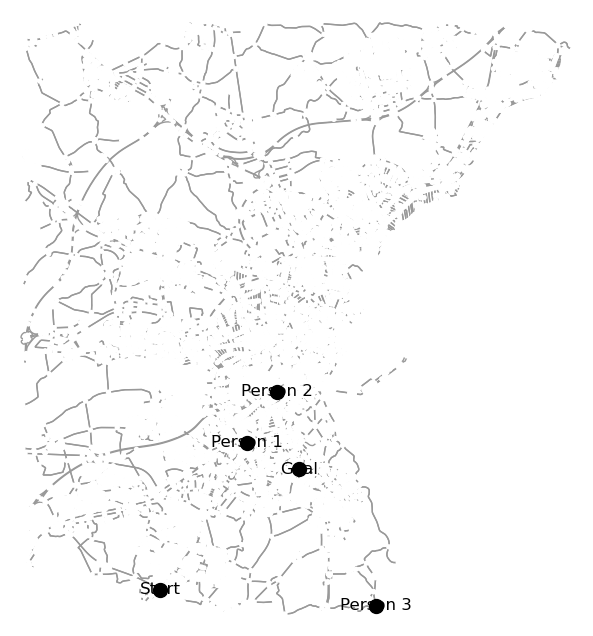

In [48]:
import warnings

# Ignore warnings
warnings.filterwarnings("ignore")

start_longi,start_lati = 10.1177416 , 56.08045679999999
goal_longi, goal_lati = 10.1934221 , 56.117051499999995
person1_longi, person1_lati = 10.16534 , 56.1251012 
person2_longi, person2_lati = 10.1814745 , 56.14053280000001
# person3_longi,person3_lati = 10.048428 , 56.2127462
# person3_longi,person3_lati = 10.1638976 , 56.218999000000004  # Real one to keep
# person3_longi,person3_lati = 10.165755300000002 , 56.1231825
person3_longi,person3_lati = 56.17823, 10.13911

start_node = ox.distance.nearest_nodes(G, start_longi, start_lati)
goal_node = ox.distance.nearest_nodes(G,goal_longi, goal_lati)
person1_node = ox.distance.nearest_nodes(G,person1_longi, person1_lati)
person2_node = ox.distance.nearest_nodes(G,person2_longi, person2_lati)
person3_node = ox.distance.nearest_nodes(G,person3_longi,person3_lati)

# Define the coordinates
# Plot the graph
fig, ax = ox.plot_graph(G, show=False, close=False, bgcolor='white')

# Add nodes for the points
pos = {node: (G.nodes[node]['x'], G.nodes[node]['y']) for node in G.nodes()}
nx.draw_networkx_nodes(G, pos, nodelist=[start_node, goal_node, person1_node, person2_node, person3_node], node_color='black', node_size=100)

# Add labels
node_labels = {start_node: 'Start', goal_node: 'Goal', person1_node: 'Person 1', person2_node: 'Person 2', person3_node: 'Person 3'}
nx.draw_networkx_labels(G, pos, labels=node_labels)

plt.show()

# Reset warnings filter
warnings.resetwarnings()


In [49]:
import math
import osmnx as ox

# Function to calculate bearing between two points
def calculate_bearing(lat1, lon1, lat2, lon2):
    d_lon = lon2 - lon1
    y = math.sin(math.radians(d_lon)) * math.cos(math.radians(lat2))
    x = math.cos(math.radians(lat1)) * math.sin(math.radians(lat2)) - math.sin(math.radians(lat1)) * math.cos(
        math.radians(lat2)) * math.cos(math.radians(d_lon))
    bearing = math.atan2(y, x)
    return math.degrees(bearing)

# Calculate the bearing from the start node to the goal node
start_to_goal_bearing = calculate_bearing(G_proj.nodes[start_node]['lat'], G_proj.nodes[start_node]['lon'],
                                          G_proj.nodes[goal_node]['lat'], G_proj.nodes[goal_node]['lon'])
print(start_to_goal_bearing)
# Identify the side of the vector from the start node to the goal node
def get_direction(node, start_node, goal_node):
    # Calculate the bearing from the start node to the given node
    node_bearing = calculate_bearing(G_proj.nodes[start_node]['lat'], G_proj.nodes[start_node]['lon'],
                                     G_proj.nodes[node]['lat'], G_proj.nodes[node]['lon'])
    # Calculate the difference in bearing between the start-to-goal vector and the start-to-node bearing
    bearing_difference = (node_bearing - start_to_goal_bearing + 180) % 360 - 180
    # Return the direction based on the bearing difference
    print("bearing_difference is: ",bearing_difference)
    if bearing_difference  < 0:
        return "Side1"
    else:
        return "OtherSide"

# Determine the direction of each person node relative to the start-to-goal vector
directions = {}
for person_node in [person1_node, person2_node, person3_node]:
    direction = get_direction(person_node, start_node, goal_node)
    directions[person_node] = direction
print(directions)
# Identify the persons that are on the opposite side of the start-to-goal vector compared to the other two persons
opposite_directioned_persons = []
same_directioned_persons = []
for person_node in [person1_node, person2_node, person3_node]:
    if directions[person_node] != directions[person1_node]:
        opposite_directioned_persons.append(person_node)
    else:
        same_directioned_persons.append(person_node)

# Check if there are only two persons on the same side of the vector
if len(same_directioned_persons) != 2:
    opposite_directioned_persons.extend(same_directioned_persons)

# Persons to keep will be the ones that are not on the opposite side of the vector
persons_to_keep = [person_node for person_node in [person1_node, person2_node, person3_node] if person_node not in opposite_directioned_persons]

print("Persons in opposite directioned plane:", opposite_directioned_persons)
print("Persons to keep:", persons_to_keep)

direction_values = []

for direction in directions.values():
    direction_values.append(direction)

print("Direction values:", direction_values)


49.04557650169465
bearing_difference is:  -18.329329328090637
bearing_difference is:  -18.466248944682548
bearing_difference is:  45.09913776616267
{1561585209: 'Side1', 5153972878: 'Side1', 1576077547: 'OtherSide'}
Persons in opposite directioned plane: [1576077547]
Persons to keep: [1561585209, 5153972878]
Direction values: ['Side1', 'Side1', 'OtherSide']


In [50]:
import warnings

# Ignore warnings
warnings.filterwarnings("ignore")

d_p1_p2 = ox.distance.great_circle_vec(G.nodes[person1_node]['y'], G.nodes[person1_node]['x'],
                                                         G.nodes[person2_node]['y'], G.nodes[person2_node]['x'])
d_p2_p3 = ox.distance.great_circle_vec(G.nodes[person2_node]['y'], G.nodes[person2_node]['x'],
                                                         G.nodes[person3_node]['y'], G.nodes[person3_node]['x'])
d_p1_p3 = ox.distance.great_circle_vec(G.nodes[person1_node]['y'], G.nodes[person1_node]['x'],
                                                         G.nodes[person3_node]['y'], G.nodes[person3_node]['x'])

d_start_p1 = ox.distance.great_circle_vec(G.nodes[start_node]['y'], G.nodes[start_node]['x'],
                                                         G.nodes[person1_node]['y'], G.nodes[person1_node]['x'])
d_start_p2 = ox.distance.great_circle_vec(G.nodes[start_node]['y'], G.nodes[start_node]['x'],
                                                         G.nodes[person2_node]['y'], G.nodes[person2_node]['x'])
d_start_p3 = ox.distance.great_circle_vec(G.nodes[start_node]['y'], G.nodes[start_node]['x'],
                                                         G.nodes[person3_node]['y'], G.nodes[person3_node]['x'])
# Reset warnings filter
warnings.resetwarnings()

print(d_p1_p2,d_p1_p3,d_p2_p3)
print(d_start_p1,d_start_p2,d_start_p3)

1985.936567929853 7008.374921720768 7952.228644710123
5775.516704009498 7761.388821233029 7320.041850353853


In [104]:
pressure = 1000
temp = 25.0
hum = 90.0
vis = 28.0
wind_dir = 160
wind_s = 10.4

timestamp = "2014-02-13T19:30:00"

### Selecting Which TSP To Apply

In [52]:
threshold = 15000

# Define the coordinates of the two persons to be included in tsp_2persons

if (d_p1_p3 > 5000 and d_p2_p3 >5000 and d_p1_p2 <=5000 and d_start_p3 > 12000) or (direction_values[2] == 'OtherSide'):
    # Omit Person 3, include persons 1 and 2
    paths,Path_t_p1_p2_dest, Path_t_p2_p1_dest = travelling_salesman_2_persons(start_node,person1_node,person2_node,goal_node,pressure,temp,hum,vis,wind_dir,wind_s,timestamp)
    min_path, min_value = min(paths, key=lambda x: x[1])
    # Print the minimum value and corresponding path
    print("As the person3 is very far or on the other side so ommiting that Person")
    print("Best Path is: ", min_path)
    print("Minimum Time Required To Reach Destination:", min_value)
    
elif d_p1_p2 > 5000 and d_p2_p3 >5000 and d_p1_p3 <=5000 and d_start_p2 > 15000 or (direction_values[1] == 'OtherSide'):
    # Omit person 2, include persons 1 and 3
    paths,Path_t_p1_p3_dest, Path_t_p3_p1_dest = travelling_salesman_2_persons(start_node,person1_node,person3_node,goal_node,pressure,temp,hum,vis,wind_dir,wind_s,timestamp)
    min_path, min_value = min(paths, key=lambda x: x[1])
    # Print the minimum value and corresponding path
    print("As the person2 is very far so ommiting that Person")
    print("Best Path is: ", min_path)
    print("Minimum Time Required To Reach Destination:", min_value)
    
elif d_p1_p2 > 5000 and d_p1_p3 >5000 and d_p2_p3 <=5000 and d_start_p1 > 15000 or (direction_values[0] == 'OtherSide'):
    # Omit person 1, include persons 2 and 3
    paths,Path_t_p2_p3_dest, Path_t_p3_p2_dest = travelling_salesman_2_persons(start_node,person1_node,person3_node,goal_node,pressure,temp,hum,vis,wind_dir,wind_s,timestamp)
    min_path, min_value = min(paths, key=lambda x: x[1])
    # Print the minimum value and corresponding path
    print("As the person2 is very far so ommiting that Person")
    print("Best Path is: ", min_path)
    print("Minimum Time Required To Reach Destination:", min_value)

else:
    # Include all persons
    paths,Path_t_p1_p2_p3_dest, Path_t_p1_p3_p2_dest, Path_t_p2_p1_p3_dest, Path_t_p2_p3_p1_dest, Path_t_p3_p1_p2_dest, Path_t_p3_p2_p1_dest = travelling_salesman(start_node,person1_node,person2_node,person3_node,goal_node,pressure,temp,hum,vis,wind_dir,wind_s,timestamp)
    min_path, min_value = min(paths ,key=lambda x: x[1])
    # Print the minimum value and corresponding path
    print("Best Path is: ", min_path)
    print("Minimum Time Required To Reach Destination:", min_value)
    # Find the minimum value and corresponding path
    min_path, min_value = min(paths, key=lambda x: x[1])


As the person3 is very far or on the other side so ommiting that Person
Best Path is:  T-->p1-->p2-->Destination
Minimum Time Required To Reach Destination: 21.676400310815755


In [61]:
# import osmnx as ox

fig, ax = ox.plot_graph_route(G, route=path_astar,
                                route_linewidth=4, node_size=15,
                                bgcolor='white', node_color="black", figsize=(64, 32))

fig, ax = ox.plot_graph_route(G, route=path_bellman_ford,
                                route_linewidth=4, node_size=15,
                                bgcolor='white', node_color="black", figsize=(64, 32))

fig, ax = ox.plot_graph_route(G, route=path_dijkstra,
                                route_linewidth=4, node_size=15,
                                bgcolor='white', node_color="black", figsize=(64, 32))


In [60]:
from pyproj import Proj, transform

# Create a Proj object for the UTM coordinate system
utm = Proj(proj='utm', zone=32, ellps='WGS84')

# Create a Proj object for the WGS84 (latitude/longitude) coordinate system
wgs84 = Proj(init='epsg:4326')

# Iterate over each node in the graph and convert UTM coordinates to latitude and longitude
print("Node Latitudes and Longitudes:")
for node, data in G_proj.nodes(data=True):
    utm_x, utm_y = data['x'], data['y']
    longitude, latitude = transform(utm, wgs84, utm_x, utm_y)
    print(f"Node {node}: Latitude = {latitude}, Longitude = {longitude}")


/home/swaksh/anaconda3/lib/python3.11/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/tmp/ipykernel_3758/2341708281.py:13: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  longitude, latitude = transform(utm, wgs84, utm_x, utm_y)


Node Latitudes and Longitudes:
Node 117270: Latitude = 56.07578410000001, Longitude = 10.208270400000002
Node 1574482839: Latitude = 56.08277859999999, Longitude = 10.209504800000001
Node 3508051847: Latitude = 56.07404189999999, Longitude = 10.2072879
Node 117275: Latitude = 56.085184999999996, Longitude = 10.210567300000001
Node 3142629619: Latitude = 56.08518559999999, Longitude = 10.210486799999998
Node 1579843923: Latitude = 56.085733999999995, Longitude = 10.220595799999998
Node 3508052812: Latitude = 56.084711499999976, Longitude = 10.2101234
Node 117283: Latitude = 56.08849310000001, Longitude = 10.2301318
Node 251616039: Latitude = 56.093462099999996, Longitude = 10.2424246
Node 476779511: Latitude = 56.084906, Longitude = 10.2341455
Node 1265965734: Latitude = 56.0866476, Longitude = 10.2245656
Node 117306: Latitude = 56.0886322, Longitude = 10.247566300000003
Node 117366: Latitude = 56.152481900000005, Longitude = 10.2083558
Node 106224348: Latitude = 56.15181029999999, Long